In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import torch
import os
import glob
import skimage
from diffusers.utils import load_image
from PIL import Image
import cv2

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
metadata = pd.read_csv("/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/mimic-cxr-2.0.0-metadata.csv.gz")
meta = metadata[(metadata['ViewPosition'] == "PA") | (metadata['ViewPosition'] == "AP")]
meta['img_path'] = meta.apply(lambda row: 'p' + str(row['subject_id'])[:2] + '/p' + str(row['subject_id']) + \
                       '/s' + str(row['study_id']) + '/' + row['dicom_id'] + '.jpg', axis = 1)

/tmp/ipykernel_3493959/1295444230.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta['img_path'] = meta.apply(lambda row: 'p' + str(row['subject_id'])[:2] + '/p' + str(row['subject_id']) + \


In [3]:
meta.iloc[0]

dicom_id                                           02aa804e-bde0afdd-112c0b34-7bc16630-4e384014
subject_id                                                                             10000032
study_id                                                                               50414267
PerformedProcedureStepDescription                                            CHEST (PA AND LAT)
ViewPosition                                                                                 PA
Rows                                                                                       3056
Columns                                                                                    2544
StudyDate                                                                              21800506
StudyTime                                                                            213014.531
ProcedureCodeSequence_CodeMeaning                                            CHEST (PA AND LAT)
ViewCodeSequence_CodeMeaning            

In [4]:
labels = pd.read_csv("/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/mimic-cxr-2.0.0-chexpert.csv.gz")

In [5]:
# About 30% has labels 
print(len(labels))
labels = labels[labels['Support Devices'] == 1]
print(len(labels))

227827
66558


In [6]:
labels 

,subject_id,study_id,Atelectasis,Cardiomegaly,Consolidation,Edema,Enlarged Cardiomediastinum,Fracture,Lung Lesion,Lung Opacity,No Finding,Pleural Effusion,Pleural Other,Pneumonia,Pneumothorax,Support Devices
28,10001217,58913004,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,1.0
29,10001401,50225296,NaN,0.0,NaN,0.0,NaN,NaN,NaN,NaN,1.0,0.0,NaN,0.0,NaN,1.0
32,10001401,56534136,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
33,10001401,57492692,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0
37,10001884,50376803,NaN,1.0,-1.0,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,NaN,NaN,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227807,19999068,58313972,NaN,NaN,NaN,NaN,-1.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,0.0,1.0
227808,19999068,59390811,-1.0,0.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,NaN,NaN,-1.0,NaN,1.0
227816,19999287,52519175,0.0,NaN,1.0,NaN,NaN,NaN,1.0,1.0,NaN,NaN,NaN,NaN,0.0,1.0
227822,19999442,58708861,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,NaN,1.0


In [7]:
meta = meta[meta['study_id'].isin(labels['study_id'])]

In [8]:
meta

,dicom_id,subject_id,study_id,PerformedProcedureStepDescription,ViewPosition,Rows,Columns,StudyDate,StudyTime,ProcedureCodeSequence_CodeMeaning,ViewCodeSequence_CodeMeaning,PatientOrientationCodeSequence_CodeMeaning,img_path
56,5e54fc9c-37c49834-9ac3b915-55811712-9d959d26,10001217,58913004,CHEST (PORTABLE AP),AP,3050,2539,21571218,191610.687,CHEST (PORTABLE AP),antero-posterior,Erect,p10/p10001217/s58913004/5e54fc9c-37c49834-9ac3...
57,0009a9fb-eb905e90-824cad7c-16d40468-007f0038,10001401,50225296,PORTABLE ABDOMEN,AP,3056,2544,21310610,102234.484,DX CHEST PORT LINE/TUBE PLCMT 1 EXAM,antero-posterior,Erect,p10/p10001401/s50225296/0009a9fb-eb905e90-824c...
63,d69651ae-dc7bacca-a05efc02-1d5882cd-001c77c4,10001401,56534136,CHEST (PORTABLE AP),AP,3056,2544,21310619,234917.640,CHEST (PORTABLE AP),antero-posterior,Erect,p10/p10001401/s56534136/d69651ae-dc7bacca-a05e...
64,a83c7ff9-2d42639c-6ddebd0e-6b67809b-38210026,10001401,57492692,PORTABLE ABDOMEN,AP,3056,2544,21310620,142643.296,DX CHEST PORT LINE/TUBE PLCMT 1 EXAM,antero-posterior,Erect,p10/p10001401/s57492692/a83c7ff9-2d42639c-6dde...
71,469d0d94-3dad5068-efac76ef-a28cc502-68fe6275,10001884,50376803,CHEST (PORTABLE AP),AP,2539,2517,21310115,44509.078,CHEST (PORTABLE AP),antero-posterior,Erect,p10/p10001884/s50376803/469d0d94-3dad5068-efac...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
377076,90f45a70-8ebf7b58-bc5d50d7-d4e28ffa-99818253,19998843,56773337,CHEST (PORTABLE AP),AP,2544,3056,21870207,51459.765,CHEST (PORTABLE AP),antero-posterior,Erect,p19/p19998843/s56773337/90f45a70-8ebf7b58-bc5d...
377095,46510b80-411ac511-fe6ffab2-d7dfdc76-dff1a762,19999287,52519175,CHEST (PORTABLE AP),AP,2544,3056,21970807,90637.796,CHEST (PORTABLE AP),antero-posterior,NaN,p19/p19999287/s52519175/46510b80-411ac511-fe6f...
377096,f7e95a22-cb958055-47114ddf-38532ef4-b4c172d5,19999287,52519175,CHEST (PORTABLE AP),AP,2544,3056,21970807,90637.796,CHEST (PORTABLE AP),antero-posterior,Erect,p19/p19999287/s52519175/f7e95a22-cb958055-4711...
377103,16b6c70f-6d36bd77-89d2fef4-9c4b8b0a-79c69135,19999442,58708861,CHEST (PORTABLE AP),AP,2544,3056,21481119,224703.375,CHEST (PORTABLE AP),antero-posterior,Erect,p19/p19999442/s58708861/16b6c70f-6d36bd77-89d2...


In [9]:
img_dir = "/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/files_preprocessed_1024/"
text_dir = "/data/healthy-ml/gobi1/data/mimic-cxr-reports/files/"

                                 FINAL REPORT
 HISTORY:  Pseudomonas with intubation.
 
 FINDINGS:  In comparison with the study of ___, there is little change in the
 monitoring and support devices.  Substantial bilateral pleural effusions, more
 prominent on the right with bibasilar atelectasis.  Unusual configuration to
 the collection of opacification at the left base raises the possibility of
 some loculated fluid.  There is again evidence of increased pulmonary venous
 pressure.  
 
 Overlapping structures somewhat obscure visualization of the left upper zone
 and simulate the appearance of cavitary process.  This area should be closely
 checked on subsequent radiographs.



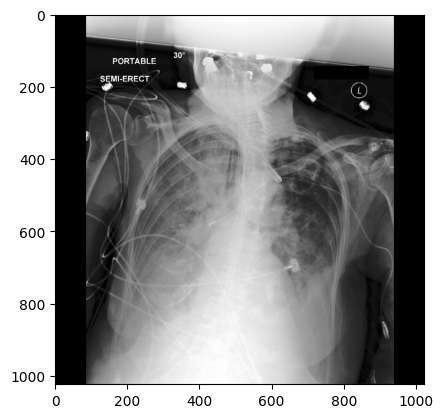

In [10]:
i = 10
img = cv2.imread(img_dir + meta['img_path'].iloc[i])
with open(f"{text_dir}p{str(meta['subject_id'].iloc[i])[:2]}/p{meta['subject_id'].iloc[i]}/s{meta['study_id'].iloc[i]}.txt", 'r') as f:
    text = f.read()
print(text)
plt.figure()
plt.imshow(img)

In [11]:
img_array = np.array(img)

In [12]:
# Just use canny edge controlnet for support device detection and removal?
edges = cv2.Canny(img,100,150,apertureSize = 3)

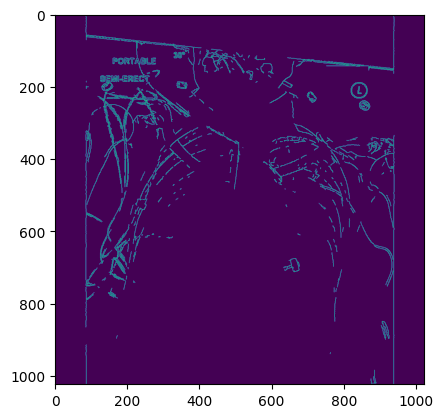

In [13]:
plt.figure()
plt.imshow(edges)

# RMS Contrast exploration

In [17]:
meta['img_path']

56        p10/p10001217/s58913004/5e54fc9c-37c49834-9ac3...
57        p10/p10001401/s50225296/0009a9fb-eb905e90-824c...
63        p10/p10001401/s56534136/d69651ae-dc7bacca-a05e...
64        p10/p10001401/s57492692/a83c7ff9-2d42639c-6dde...
71        p10/p10001884/s50376803/469d0d94-3dad5068-efac...
                                ...                        
377076    p19/p19998843/s56773337/90f45a70-8ebf7b58-bc5d...
377095    p19/p19999287/s52519175/46510b80-411ac511-fe6f...
377096    p19/p19999287/s52519175/f7e95a22-cb958055-4711...
377103    p19/p19999442/s58708861/16b6c70f-6d36bd77-89d2...
377108    p19/p19999987/s58621812/7ba273af-3d290f8d-e28d...
Name: img_path, Length: 73294, dtype: object

In [20]:
from tqdm import tqdm

In [56]:
# Visualize what kinds of image have high contrast versus low contrast 
rms_contrast = []
for i in tqdm(range(10000)):
    img = cv2.imread(img_dir + meta['img_path'].iloc[i])
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    rms_contrast.append(img_grey.std())

100%|███████████████████████████████████████████████| 10000/10000 [08:06<00:00, 20.55it/s]


In [57]:
rms_contrast = np.array(rms_contrast)

In [58]:
print(np.mean(rms_contrast))

81.72474066474754


In [59]:
print(np.std(rms_contrast))

2.4292377424640943


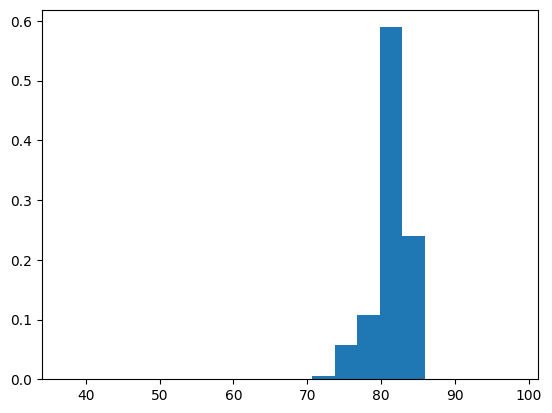

In [69]:
plt.hist(rms_contrast, weights = np.ones_like(rms_contrast) / len(rms_contrast), bins=20)
plt.show()

In [182]:
high_contrast_idx = np.nonzero(rms_contrast > 85)[0]
low_contrast_idx = np.nonzero(rms_contrast <= 74)[0]
print(len(high_contrast_idx))
print(len(low_contrast_idx))

131
136


85.10169436496145
85.24877851651694
85.16258363428383
85.1488832515412
85.08960008906885
85.23029176752351
85.20386765070458
85.2138796158505


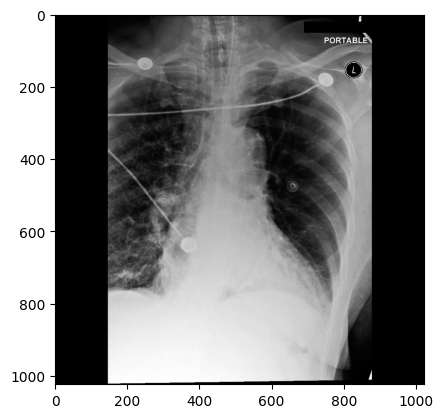

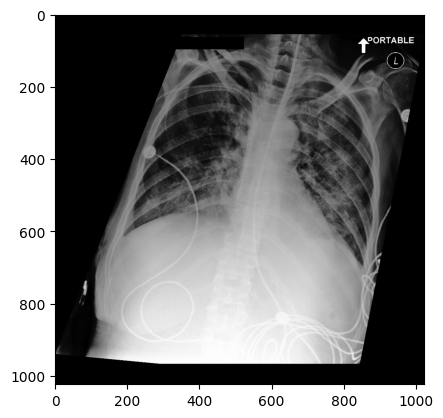

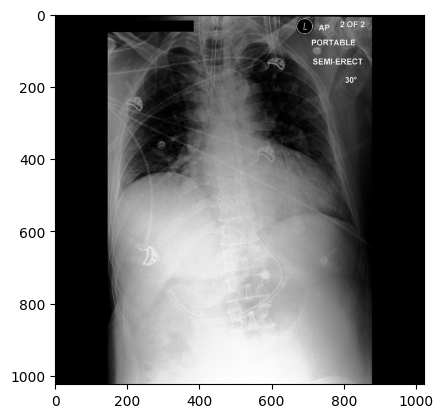

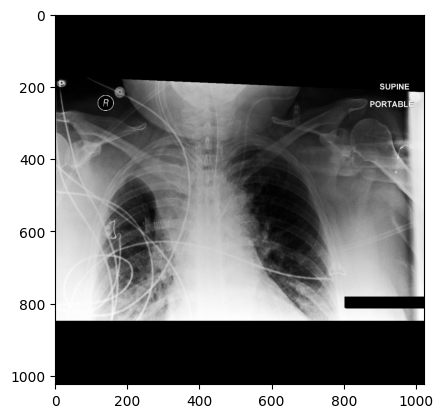

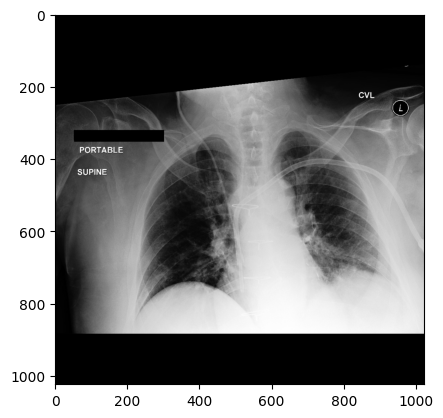

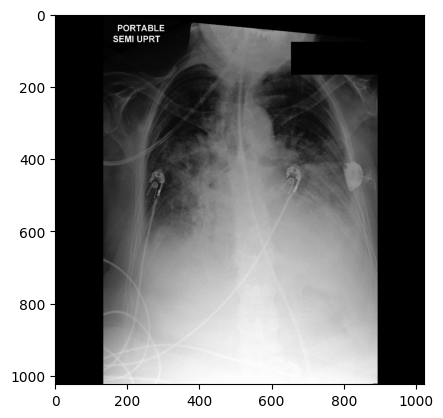

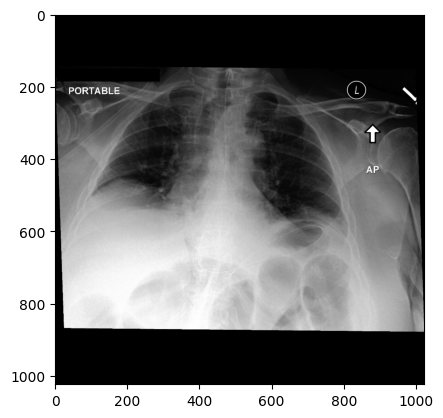

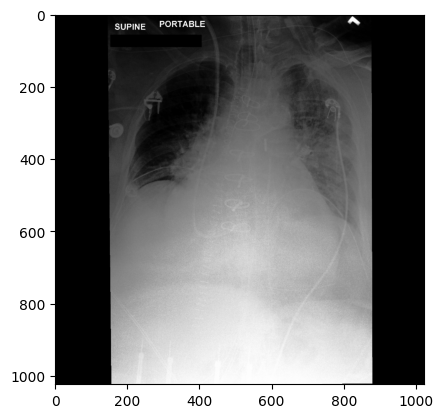

In [37]:
for i in high_contrast_idx: 
    print(rms_contrast[i])
    img = cv2.imread(img_dir + meta['img_path'].iloc[i])
    plt.figure()
    plt.imshow(img)

73.96243385517617
73.98879448300809
73.89668668025917
69.7423758789363
73.87638811245101
73.97968852503114
73.57807538525041
73.91180368527345
73.98822821600756
73.98417904959598
73.89323614932412


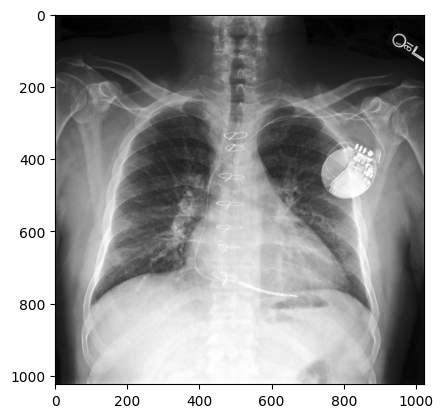

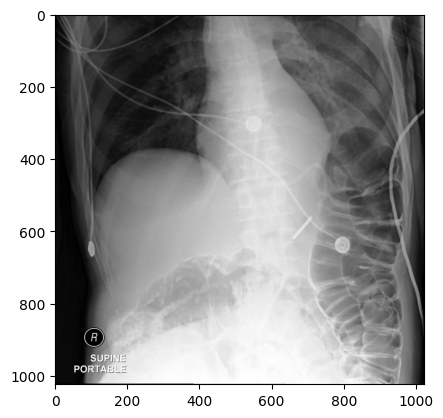

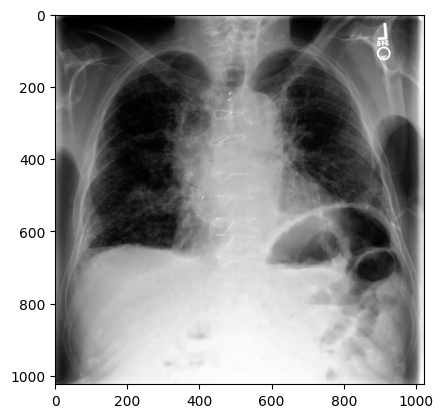

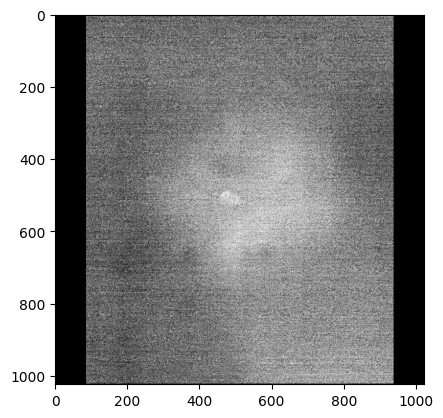

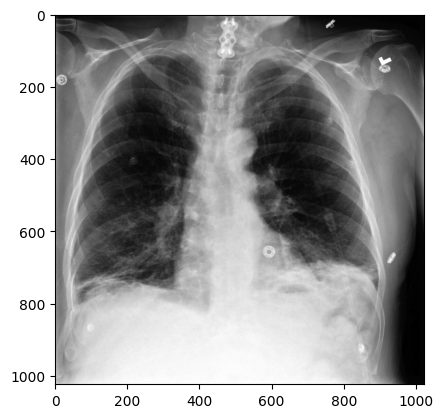

...

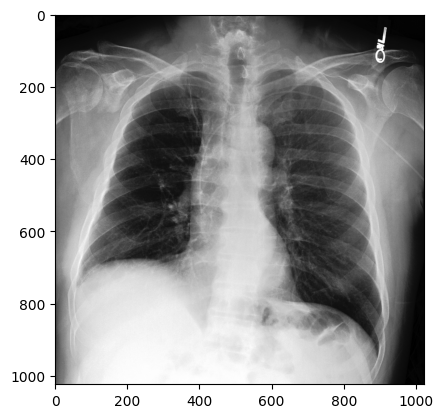

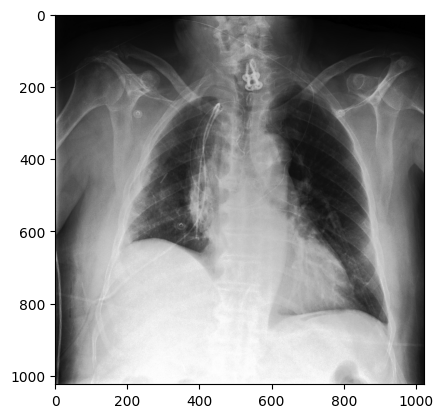

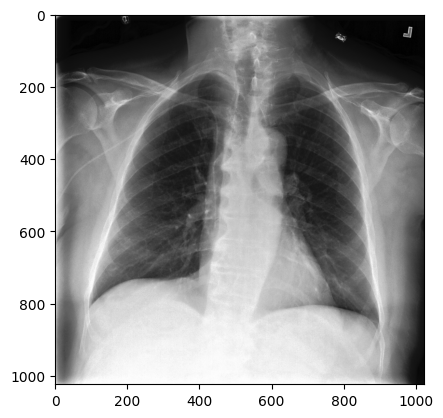

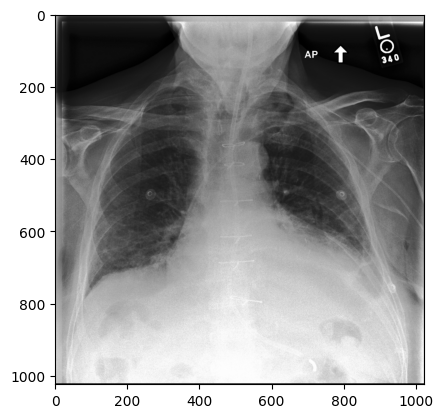

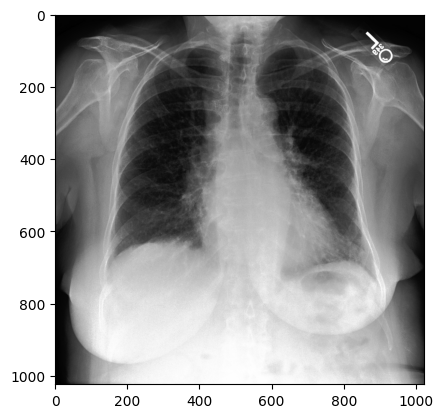

In [38]:
for i in low_contrast_idx: 
    print(rms_contrast[i])
    img = cv2.imread(img_dir + meta['img_path'].iloc[i])
    plt.figure()
    plt.imshow(img)

In [45]:
img_dir + meta['img_path'].iloc[0]

'/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/files_preprocessed_1024/p10/p10001217/s58913004/5e54fc9c-37c49834-9ac3b915-55811712-9d959d26.jpg'

In [ ]:
# Same analysis on generated images 

In [47]:
import pathlib

In [49]:
folder = '/data/healthy-ml/scratch/qixuanj/generative_validation/results/controlnet_validation/roentgen_controlnet_chexmask_run3/checkpoint-47500'
data_root = pathlib.Path(folder)
all_files = list(data_root.rglob('*.jpg'))
all_files = [str(path) for path in all_files]

In [50]:
all_files[0]

'/data/healthy-ml/scratch/qixuanj/generative_validation/results/controlnet_validation/roentgen_controlnet_chexmask_run3/checkpoint-47500/b0d66a09-9046da48-afa0f47b-7af16b42-e2c2d37e/prompt2.jpg'

In [62]:
# For generated images 
rms_contrast_gen = []
for i in tqdm(range(10000)):
    img = cv2.imread(all_files[i])
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    rms_contrast_gen.append(img_grey.std())

100%|███████████████████████████████████████████████| 10000/10000 [03:32<00:00, 47.15it/s]


In [88]:
rms_contrast_gen = np.array(rms_contrast_gen)
print(np.mean(rms_contrast_gen))
print(np.std(rms_contrast_gen))

77.59227007377847
8.877709241223924


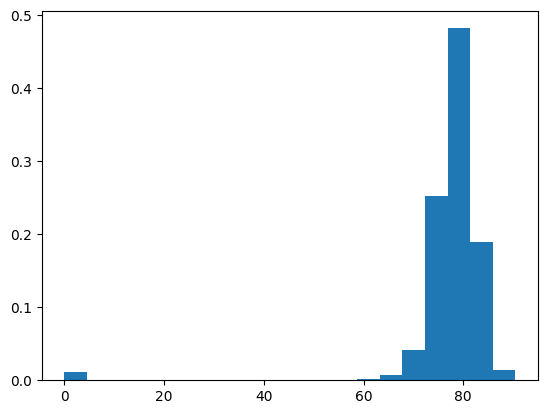

In [65]:
plt.hist(rms_contrast_gen, weights = np.ones_like(rms_contrast_gen) / len(rms_contrast_gen), bins=20)
plt.show()

In [86]:
high_contrast_idx = np.nonzero(rms_contrast_gen > 87)[0]
low_contrast_idx = np.nonzero((rms_contrast_gen > 10) & (rms_contrast_gen < 65))[0]
print(len(high_contrast_idx))
print(len(low_contrast_idx))

54
39


88.0154409806405
88.13951929571276
87.68004666345419
87.70989884327291
87.22824383396986
89.18245811970256
89.93776762333721
87.17738633560909
87.41780082991735
88.33389343285671


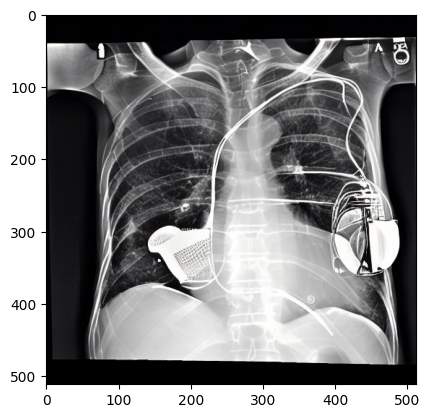

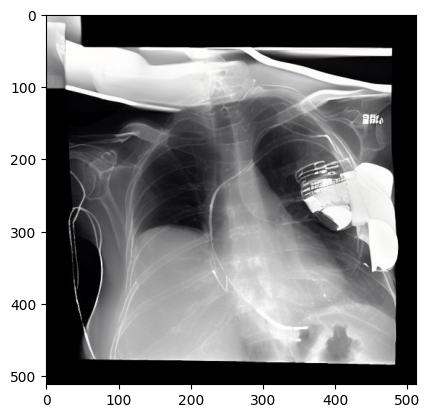

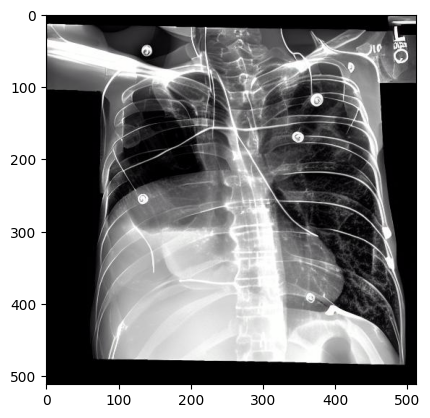

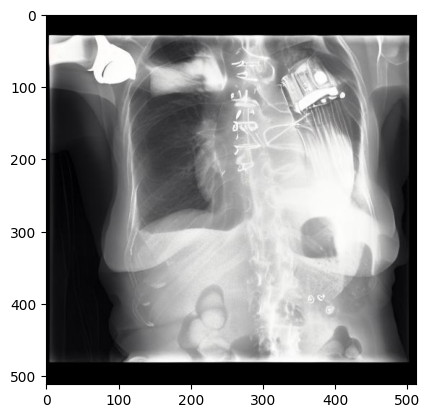

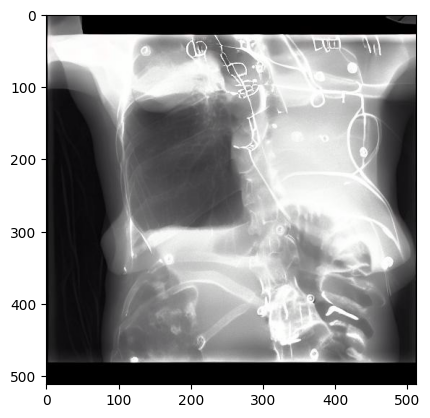

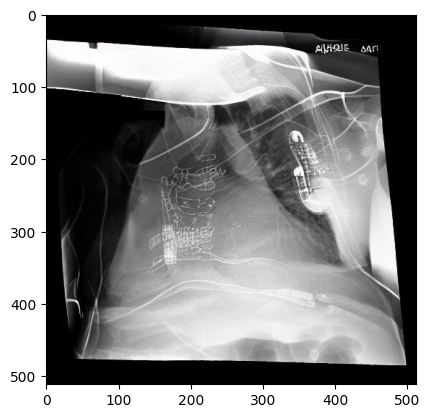

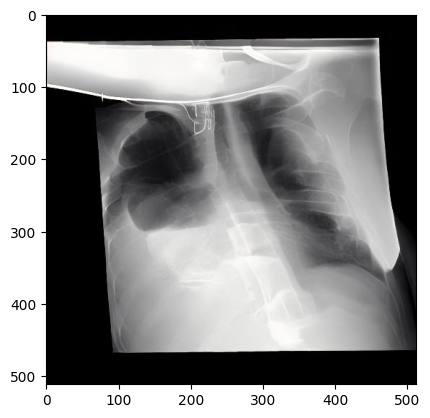

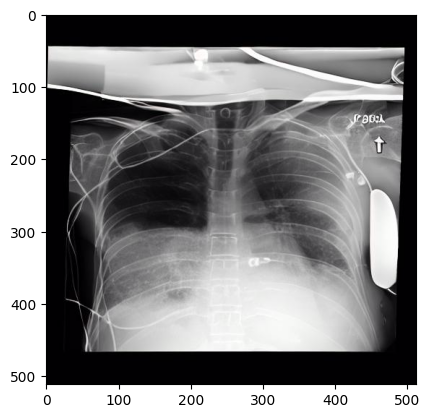

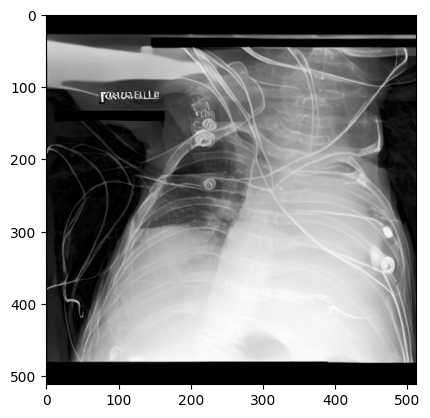

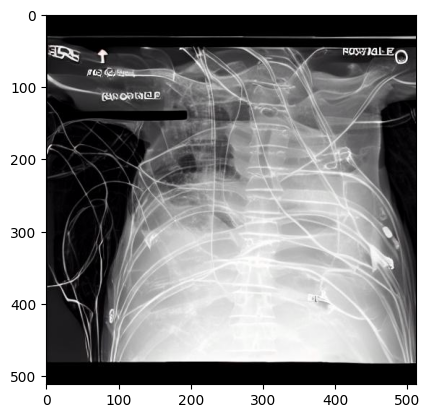

In [84]:
for i in high_contrast_idx[:10]: 
    print(rms_contrast_gen[i])
    img = cv2.imread(all_files[i])
    plt.figure()
    plt.imshow(img)

64.18300796082914
63.21907707527772
62.5492373024271
58.85585639913639
61.65531143091149
64.78690416973427
64.66621929999901
63.239783643625785
49.42331759657441
64.02111656883629


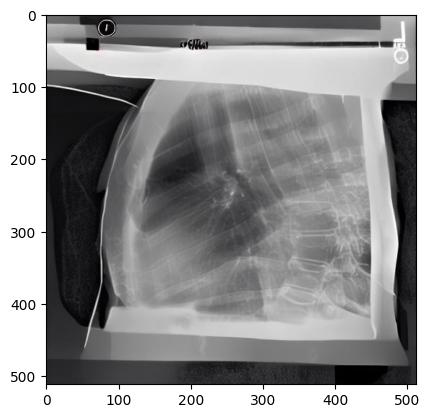

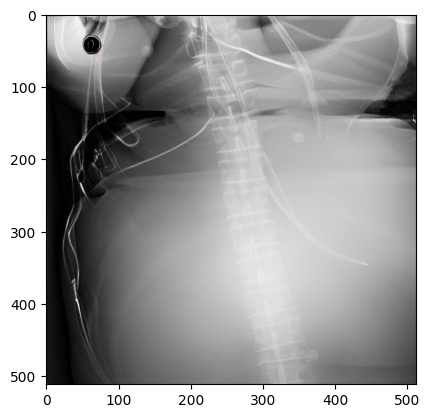

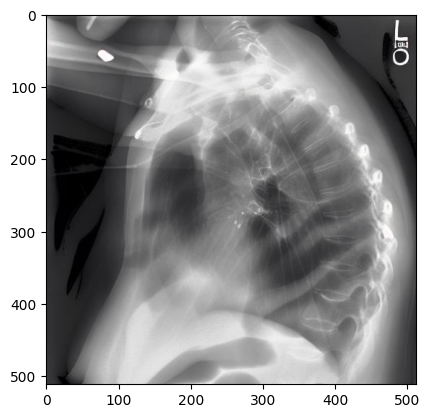

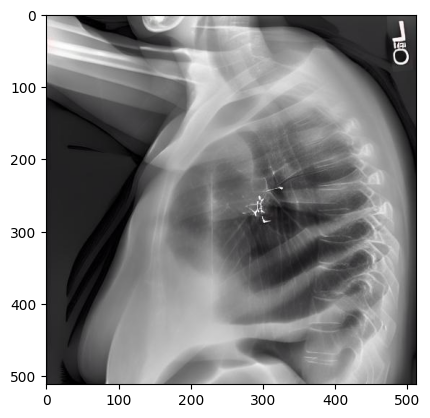

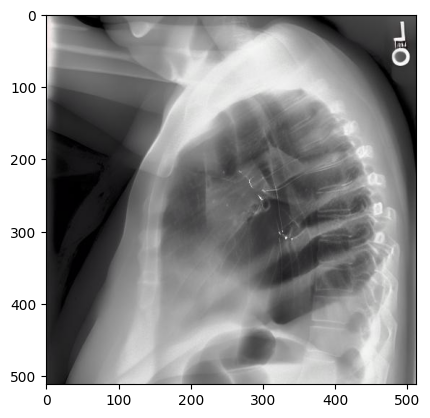

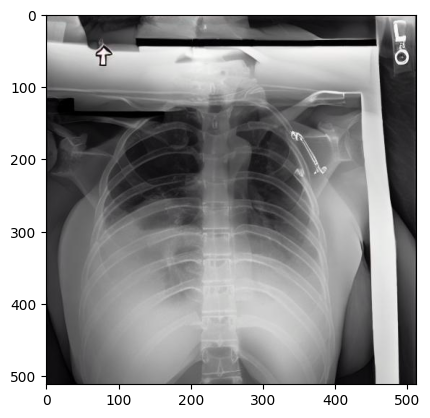

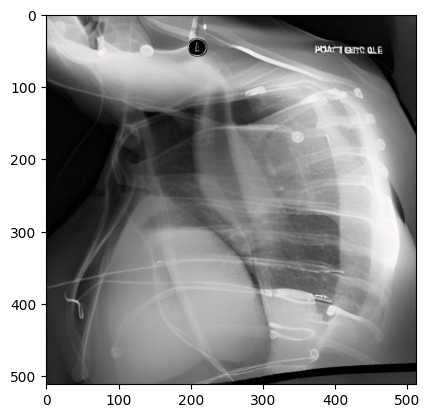

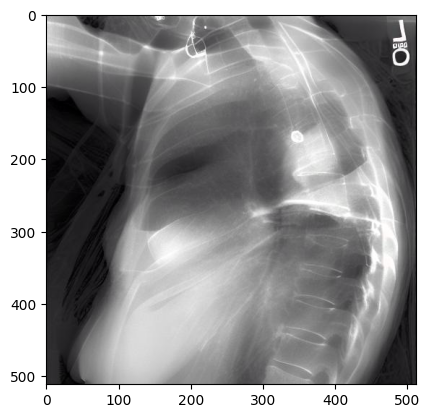

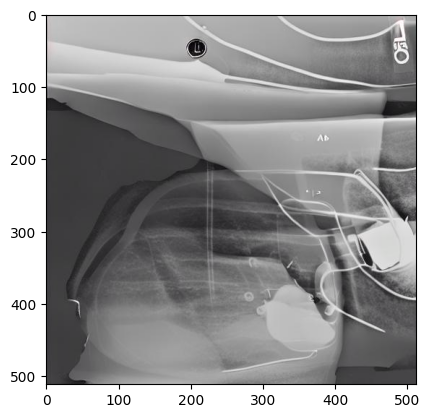

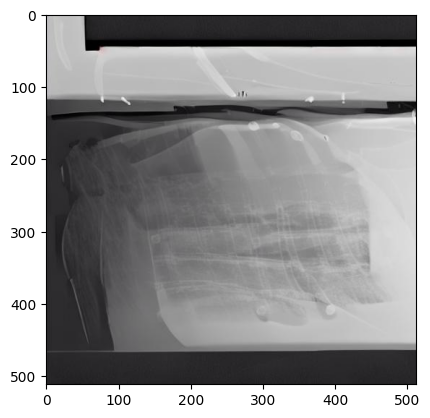

In [87]:
for i in low_contrast_idx[:10]: 
    print(rms_contrast_gen[i])
    img = cv2.imread(all_files[i])
    plt.figure()
    plt.imshow(img)

In [91]:
mean_idx = np.nonzero((rms_contrast_gen >= 76) & (rms_contrast_gen < 77))[0]
print(len(mean_idx))

920


76.10624920368532
76.45615094880748
76.48420570300175
76.18246598501983
76.9328303646076
76.56463629060076
76.41835024209217
76.36720092942491
76.46479192977696
76.61298734465755


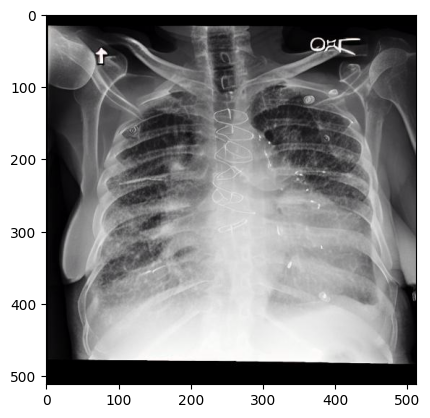

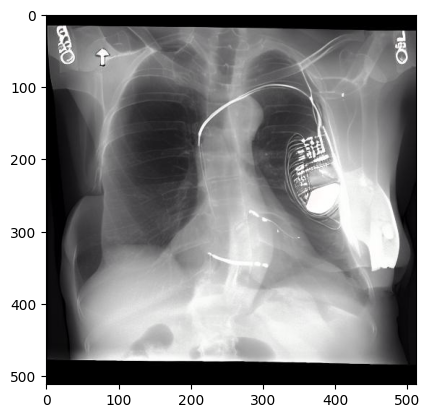

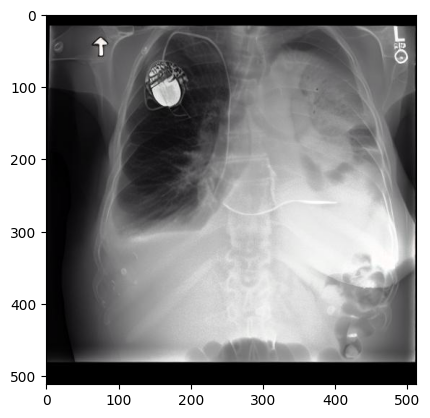

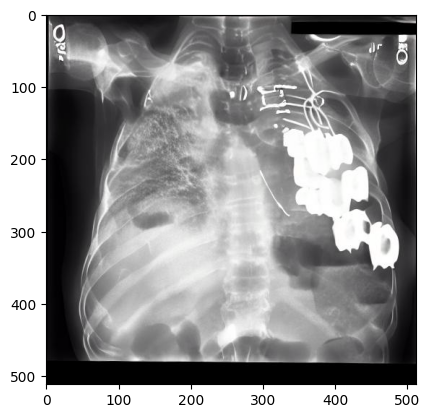

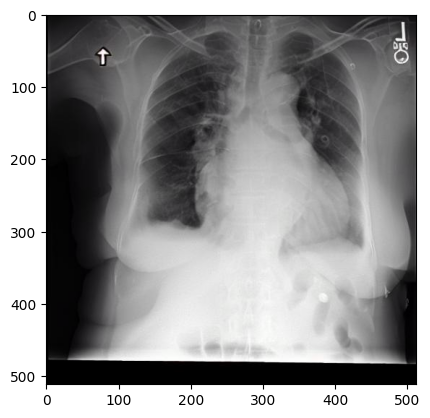

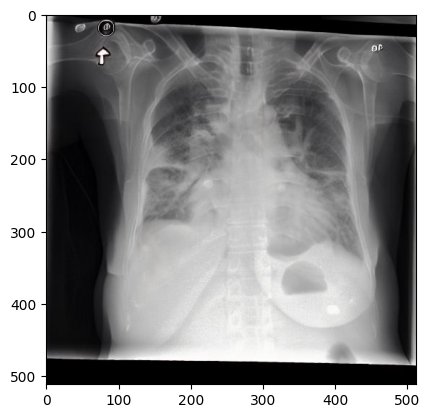

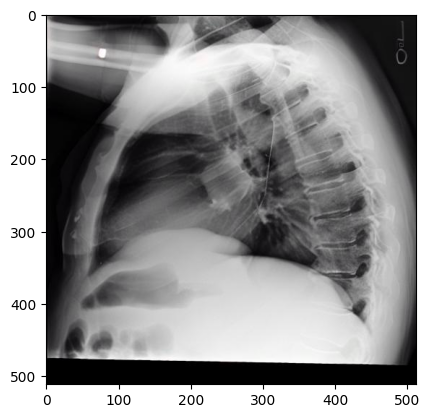

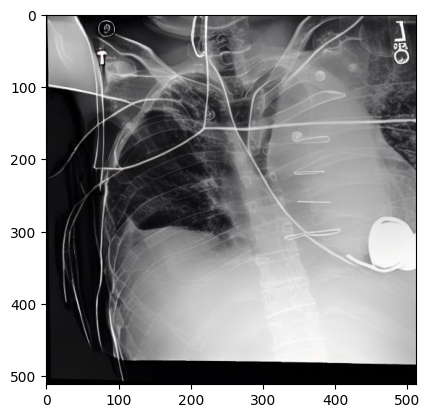

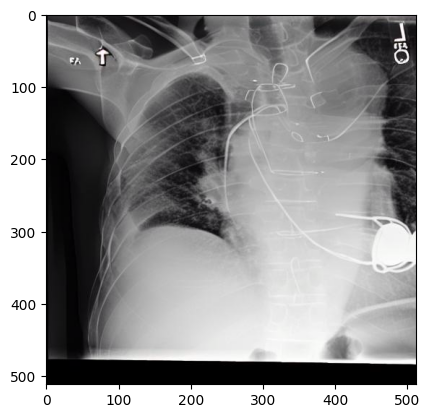

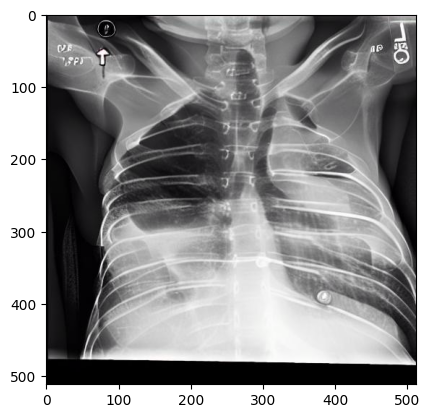

In [92]:
# Not much better in quality 
for i in mean_idx[:10]: 
    print(rms_contrast_gen[i])
    img = cv2.imread(all_files[i])
    plt.figure()
    plt.imshow(img)

# Template Matching

In [193]:
print(meta['img_path'].iloc[low_contrast_idx[0]])

p10/p10003637/s57024735/f6119cd4-a5ef793e-db8543a2-f8d4a0e1-8c8aeb54.jpg


In [ ]:
# Template image for: p10/p10003637/s57024735/f6119cd4-a5ef793e-db8543a2-f8d4a0e1-8c8aeb54.jpg 

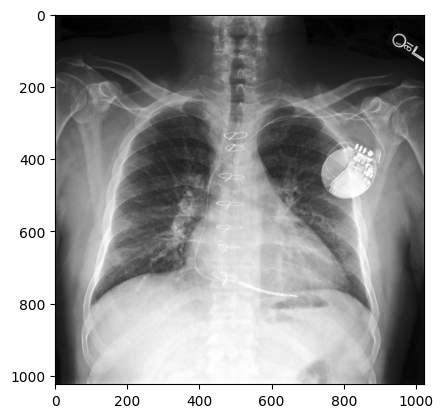

In [275]:
img = cv2.imread(img_dir + meta['img_path'].iloc[low_contrast_idx[0]])
plt.imshow(img)

In [192]:
img.shape

(1024, 1024, 3)

In [190]:
template = img[350:512, 725:900, :]
w, h = template.shape[:2]

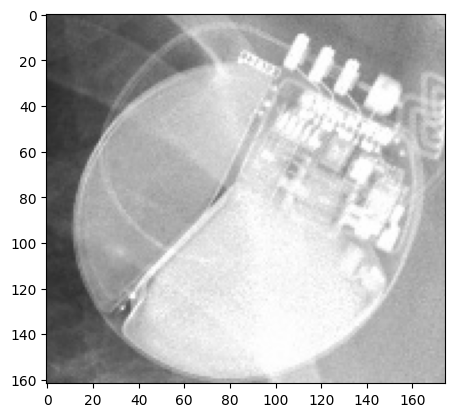

In [191]:
plt.imshow(template)

In [115]:
import cv2 as cv

In [116]:
res = cv.matchTemplate(img, template, cv.TM_CCOEFF_NORMED)
threshold = 0.8 

In [117]:
loc = np.where(res >= threshold)

In [136]:
print(len(loc[0]))

640


In [129]:
img_res = img.copy()
for pt in zip(*loc[::-1]):
    cv.rectangle(img_res, pt, (pt[0] + w, pt[1] + h), (0,0,255), 1)

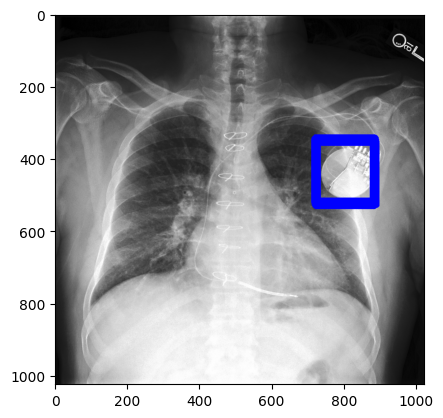

In [130]:
plt.imshow(img_res)

In [152]:
res_imgs = []
threshold = 0.6
for i in tqdm(range(500)):
    img = cv2.imread(img_dir + meta['img_path'].iloc[i])
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    res = cv.matchTemplate(img, template, cv.TM_CCOEFF_NORMED) 
    loc = np.where(res >= threshold)
    if len(loc[0]) > 0: 
        img_res = img.copy()
        for pt in zip(*loc[::-1]):
            cv.rectangle(img_res, pt, (pt[0] + w, pt[1] + h), (0,0,255), 1)
        res_imgs.append(img_res)

100%|███████████████████████████████████████████████████| 500/500 [00:55<00:00,  9.03it/s]


In [155]:
print(len(res_imgs))

0


In [ ]:
# 296 at 0.5, not good match
# none above 0.6

In [20]:
df = pd.read_csv("/data/healthy-ml/gobi1/data/chexmask-cxr-segmentation-data/0.2/Preprocessed/MIMIC-CXR-JPG.csv")
meta = pd.read_csv("/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/mimic-cxr-2.0.0-metadata_no_LAT.csv.gz")
df = pd.merge(df, meta[['dicom_id', 'subject_id', 'study_id', 'ViewPosition', 'img_path']], left_on = "dicom_id", right_on="dicom_id")

ParserError: Error tokenizing data. C error: Calling read(nbytes) on source failed. Try engine='python'.

In [162]:
df.columns

Index(['dicom_id', 'Dice RCA (Mean)', 'Dice RCA (Max)', 'Landmarks',
       'Left Lung', 'Right Lung', 'Heart', 'Height', 'Width', 'subject_id',
       'study_id', 'ViewPosition', 'img_path'],
      dtype='object')

In [163]:
labels.columns

Index(['subject_id', 'study_id', 'Atelectasis', 'Cardiomegaly',
       'Consolidation', 'Edema', 'Enlarged Cardiomediastinum', 'Fracture',
       'Lung Lesion', 'Lung Opacity', 'No Finding', 'Pleural Effusion',
       'Pleural Other', 'Pneumonia', 'Pneumothorax', 'Support Devices'],
      dtype='object')

In [ ]:
labels = pd.merge(labels, df[['subject_id', 'study_id', 'img_path']], 
         left_on = ["study_id", "subject_id"], right_on = ["study_id", "subject_id"])

In [21]:
support_devices = labels[labels['Support Devices'] == 1]

In [22]:
print(len(support_devices))

66558


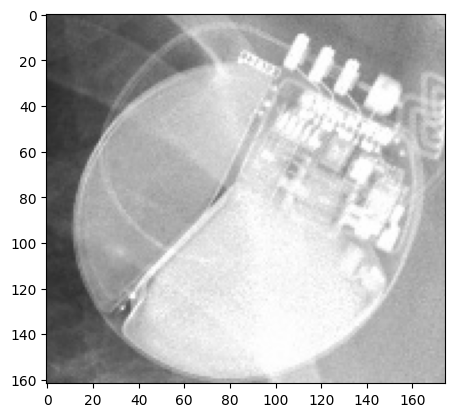

In [274]:
plt.imshow(template)

p10/p10010867/s53658667/a7b42563-594d6a7c-8d7c5b2e-1b7080c9-2e855344.jpg


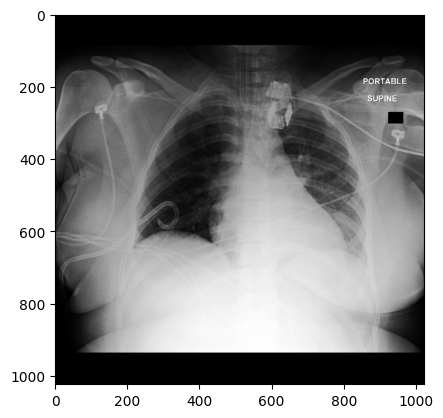

In [203]:
i = 79
img = cv2.imread(img_dir + support_devices['img_path'].iloc[i])
print(support_devices['img_path'].iloc[i])
plt.imshow(img)

In [216]:
# 52 is the original 
pacemaker_idx = [52, 76, 79, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 121, 129,
                 144, 149]

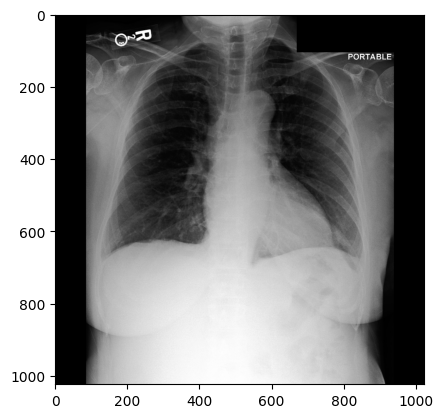

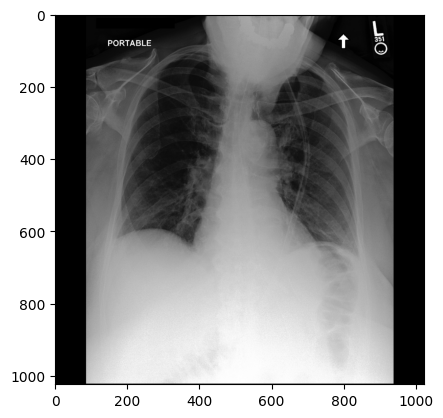

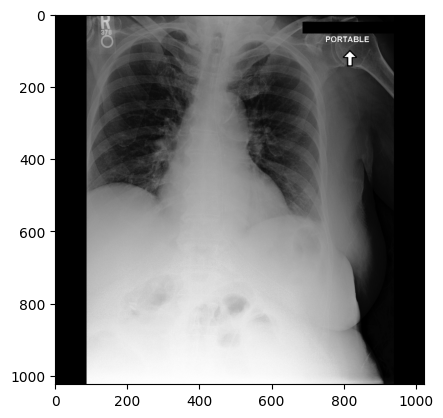

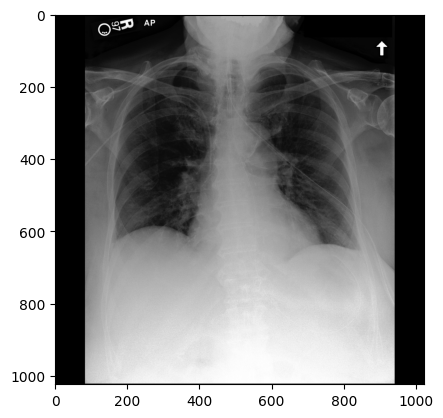

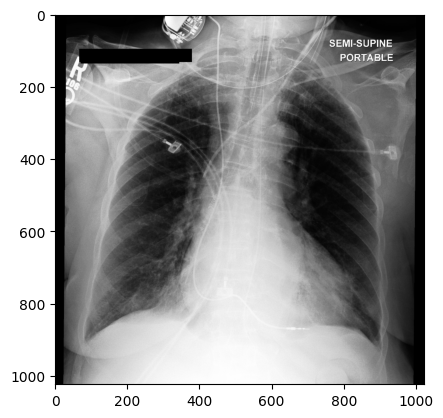

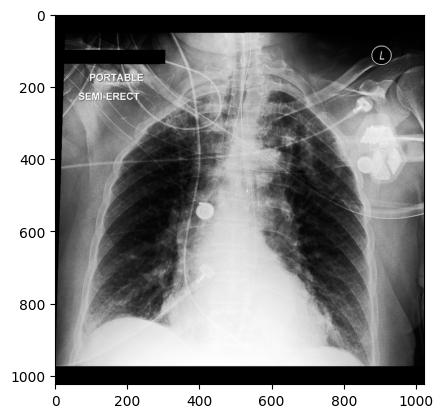

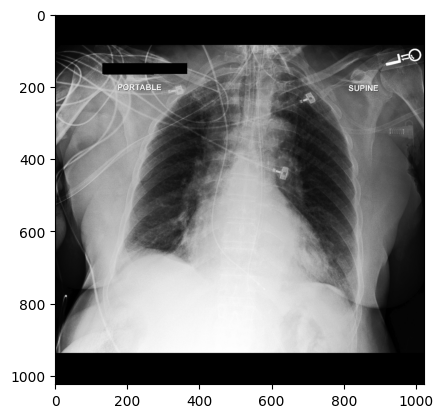

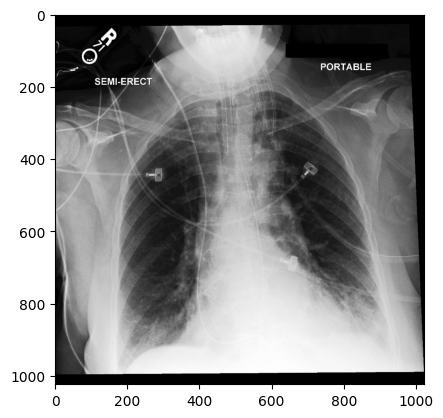

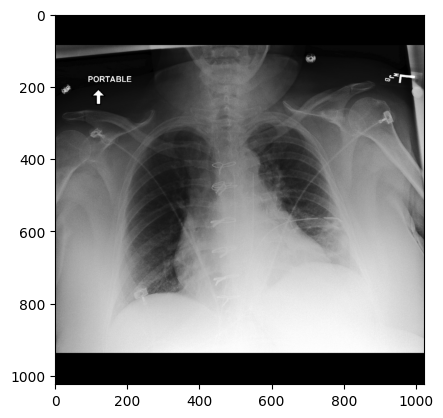

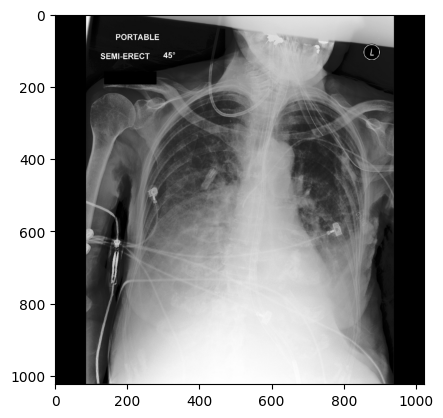

In [278]:
for i in range(0, 10):
    img = cv2.imread(img_dir + support_devices['img_path'].iloc[i])
    img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    plt.figure()
    plt.imshow(img)

In [235]:
# Adapted from: https://towardsdatascience.com/non-maxima-suppression-139f7e00f0b5 

def NMS(boxes, threshold = 0.4):
    # Return an empty list, if no boxes given
    if len(boxes) == 0:
        return []
    x1 = boxes[:, 0]  # x coordinate of the top-left corner
    y1 = boxes[:, 1]  # y coordinate of the top-left corner
    x2 = boxes[:, 2]  # x coordinate of the bottom-right corner
    y2 = boxes[:, 3]  # y coordinate of the bottom-right corner
    # Compute the area of the bounding boxes and sort the bounding
    # Boxes by the bottom-right y-coordinate of the bounding box
    areas = (x2 - x1 + 1) * (y2 - y1 + 1) # We add 1, because the pixel at the start as well as at the end counts
    # The indices of all boxes at start. We will redundant indices one by one.
    indices = np.arange(len(x1))
    for i,box in enumerate(boxes):
        # Create temporary indices  
        temp_indices = indices[indices!=i]
        # Find out the coordinates of the intersection box
        xx1 = np.maximum(box[0], boxes[temp_indices,0])
        yy1 = np.maximum(box[1], boxes[temp_indices,1])
        xx2 = np.minimum(box[2], boxes[temp_indices,2])
        yy2 = np.minimum(box[3], boxes[temp_indices,3])
        # Find out the width and the height of the intersection box
        w = np.maximum(0, xx2 - xx1 + 1)
        h = np.maximum(0, yy2 - yy1 + 1)
        # compute the ratio of overlap
        overlap = (w * h) / areas[temp_indices]
        # if the actual bounding box has an overlap bigger than threshold with any other box, remove its index  
        if np.any(overlap) > threshold:
            indices = indices[indices != i]
    #return only the boxes at the remaining indices
    return boxes[indices].astype(int)

In [231]:
boxes = []
for j in range(len(sample_loc[0])):
    box = [sample_loc[0][j], sample_loc[1][j], sample_loc[0][j] + w, sample_loc[1][j] + h]
    boxes.append(box)
boxes = np.array(boxes)

In [236]:
new_boxes = NMS(boxes, threshold = 0.4)

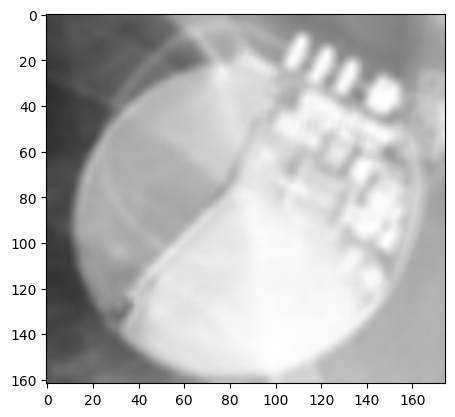

In [279]:
template1 = template.copy()
template1 = cv.blur(template1, (5, 5))
plt.imshow(template1)

In [270]:
res_imgs = []
threshold = 0.80
use_nms = False 
use_blur = False

for p in pacemaker_idx:
    img = cv2.imread(img_dir + meta['img_path'].iloc[p])
    # img_grey = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    if use_blur: 
        img = cv2.blur(img, (5, 5))
    res = cv.matchTemplate(img, template1, cv.TM_CCOEFF_NORMED) 
    loc = np.where(res >= threshold)
    if len(loc[0]) > 0:
        img_res = img.copy()
        # NMS implemented 
        if use_nms:
            boxes = []
            for j in range(len(sample_loc[0])):
                box = [sample_loc[0][j], sample_loc[1][j], sample_loc[0][j] + w, sample_loc[1][j] + h]
                boxes.append(box)
            boxes = np.array(boxes)
            new_boxes = NMS(boxes, threshold = 0.6)
            for b in new_boxes: 
                cv.rectangle(img_res, (b[0], b[1]), (b[2], b[3]), (0,0,255), 10)
        else:
            for pt in zip(*loc[::-1]):
                cv.rectangle(img_res, pt, (pt[0] + w, pt[1] + h), (0,0,255), 2)
        res_imgs.append(img_res)  
print(len(res_imgs))

17


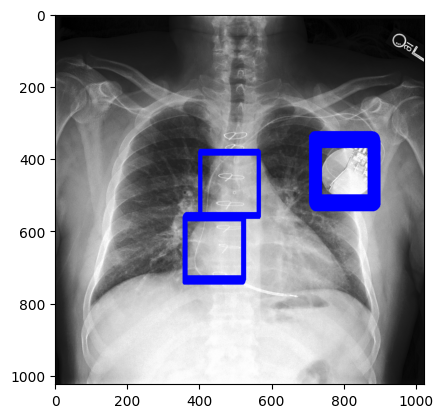

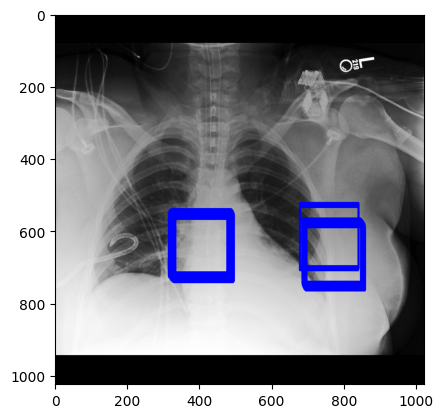

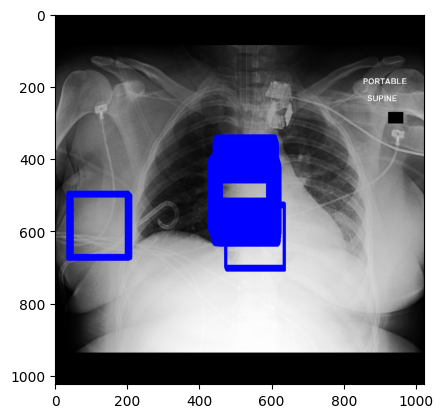

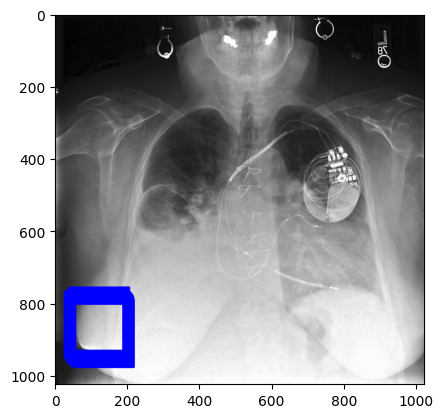

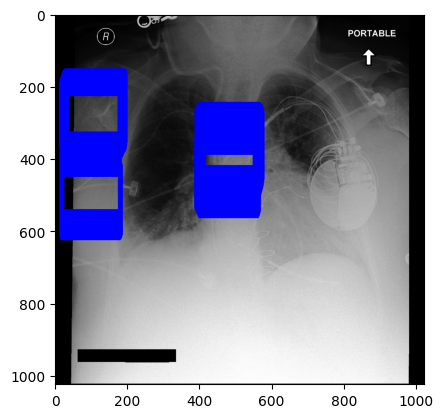

...

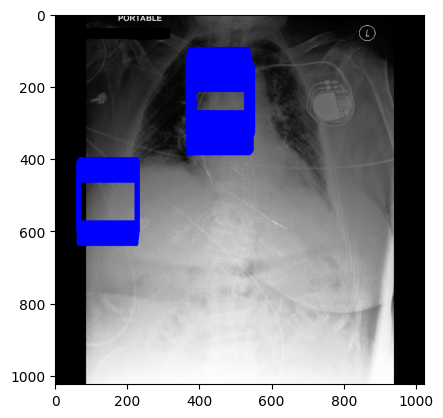

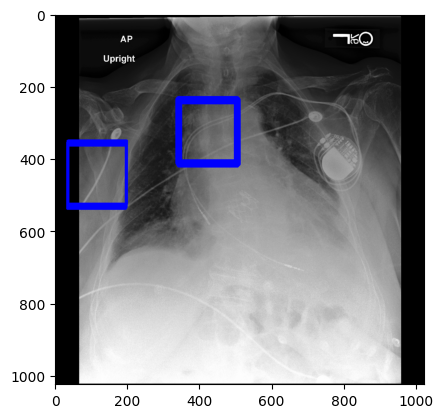

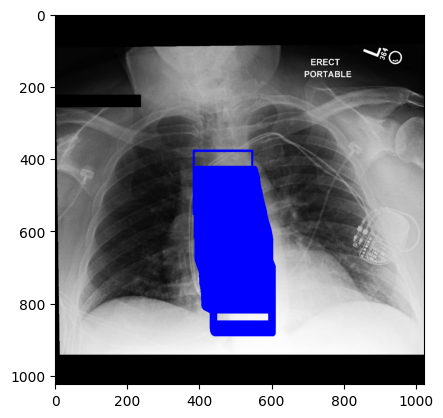

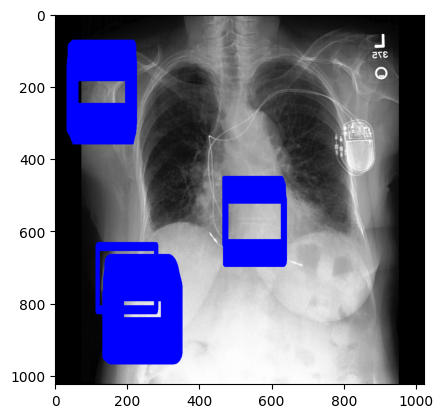

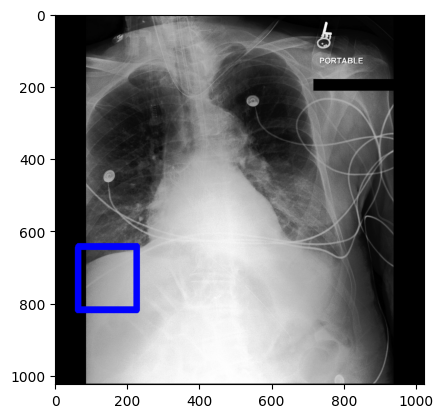

In [271]:
for image in res_imgs: 
    plt.figure()
    plt.imshow(image)

In [ ]:
# Code adapted from: https://github.com/brkyzdmr/TemplateMatcher/blob/main/template_matcher.py

In [273]:
MIN_MATCH_COUNT = 2

def get_matched_coordinates(temp_img, map_img):
    """
    Gets template and map image and returns matched coordinates in map image

    Parameters
    ----------
    temp_img: image
        image to be used as template

    map_img: image 
        image to be searched in

    Returns
    ---------
    ndarray
        an array that contains matched coordinates

    """

    # initiate SIFT detector
    sift = cv2.SIFT_create()

    # find the keypoints and descriptors with SIFT
    kp1, des1 = sift.detectAndCompute(temp_img, None)
    kp2, des2 = sift.detectAndCompute(map_img, None)

    FLANN_INDEX_KDTREE = 0
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)

    # find matches by knn which calculates point distance in 128 dim
    matches = flann.knnMatch(des1, des2, k=2)

    # store all the good matches as per Lowe's ratio test.
    good = []
    for m, n in matches:
        if m.distance < 0.7*n.distance:
            good.append(m)

    if len(good) > MIN_MATCH_COUNT:
        src_pts = np.float32(
            [kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
        dst_pts = np.float32(
            [kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

        # find homography
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
        matchesMask = mask.ravel().tolist()

        h, w = temp_img.shape
        pts = np.float32([[0, 0], [0, h-1], [w-1, h-1],
                          [w-1, 0]]).reshape(-1, 1, 2)
        dst = cv2.perspectiveTransform(pts, M)  # matched coordinates
        
        map_img = cv2.polylines(
            map_img, [np.int32(dst)], True, 255, 3, cv2.LINE_AA)

    else:
        print("Not enough matches are found - %d/%d" %
              (len(good), MIN_MATCH_COUNT))
        matchesMask = None

    draw_params = dict(matchColor=(0, 255, 0),  # draw matches in green color
                       singlePointColor=None,
                       matchesMask=matchesMask,  # draw only inliers
                       flags=2)

    # draw template and map image, matches, and keypoints
    img3 = cv2.drawMatches(temp_img, kp1, map_img, kp2,
                           good, None, **draw_params)
    return dst, img3

In [277]:
template.shape

(162, 175, 3)

In [276]:
# equalize histograms
temp_img_eq = cv2.equalizeHist(template)
map_img_eq = cv2.equalizeHist(img)
# calculate matched coordinate

error: OpenCV(4.3.0) /io/opencv/modules/imgproc/src/histogram.cpp:3439: error: (-215:Assertion failed) _src.type() == CV_8UC1 in function 'equalizeHist'


In [ ]:
img_drawn, coords = get_matched_coordinates(temp_img_eq, map_img_eq)

# Crop example images for textual inversion

In [32]:
img_dir

'/data/healthy-ml/gobi1/data/MIMIC-CXR-JPG/files_preprocessed_1024/'

In [28]:
meta = meta[meta['study_id'].isin(support_devices['study_id'])]

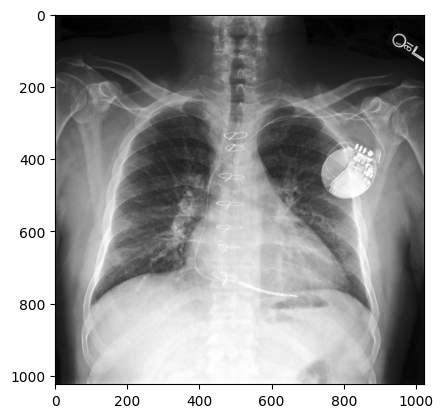

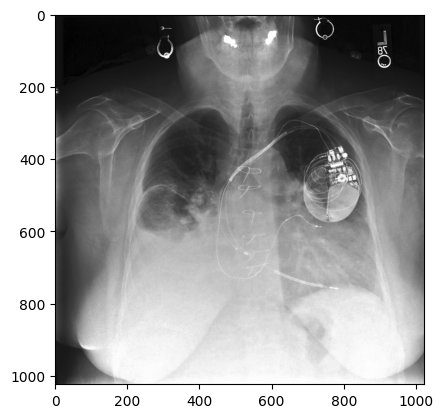

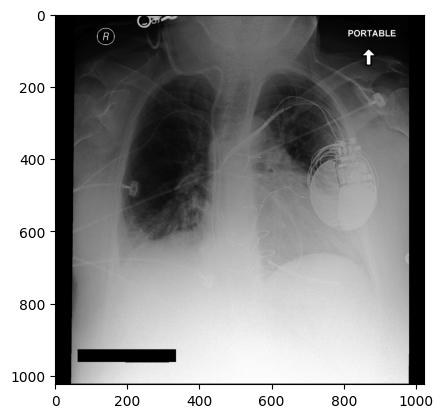

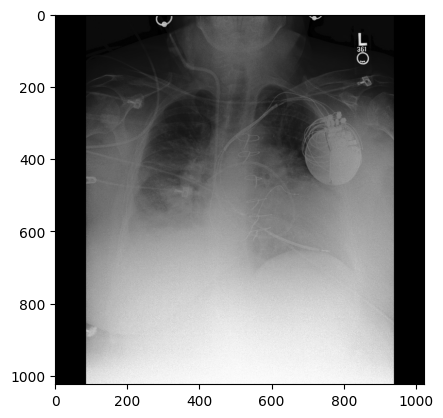

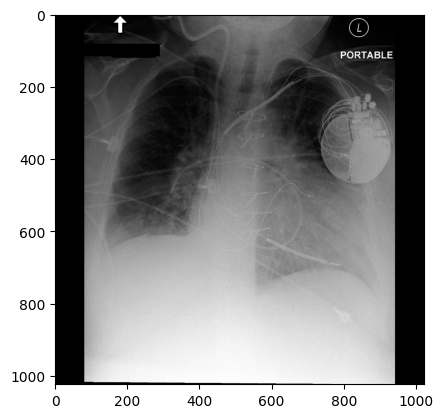

...

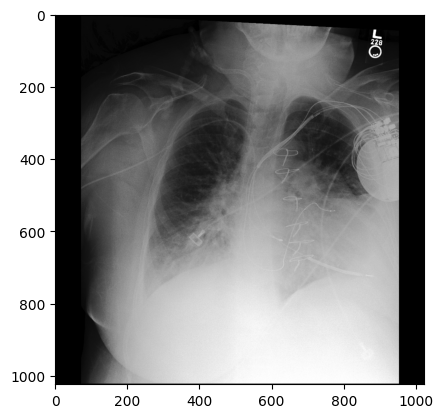

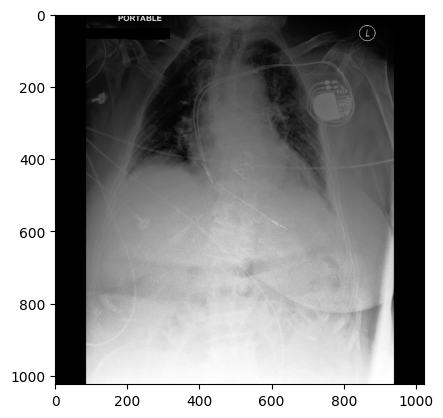

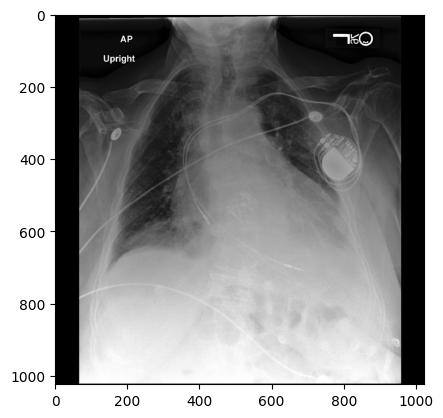

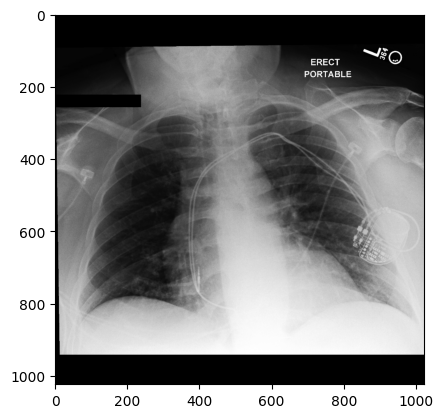

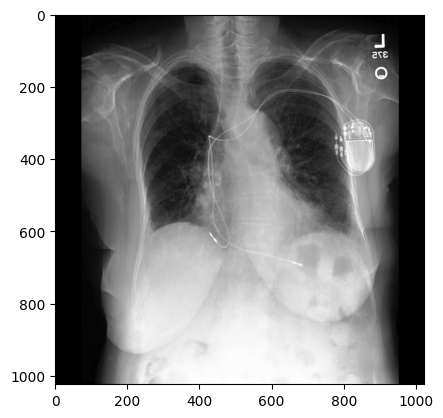

In [31]:
pacemaker_idx = [52, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 121, 129, 144]
for i in pacemaker_idx:
    plt.figure()
    img = cv2.imread(img_dir + meta['img_path'].iloc[i])
    plt.imshow(img)

In [33]:
data_dir = "/data/healthy-ml/gobi1/data/qixuanj/gen_valid_pacemakers"
if not os.path.exists(data_dir): 
    os.makedirs(data_dir)

p10_p10015048_s50474111_12fd2ed8-5a501563-a86d9388-5ba1a246-2ac9104b.jpg


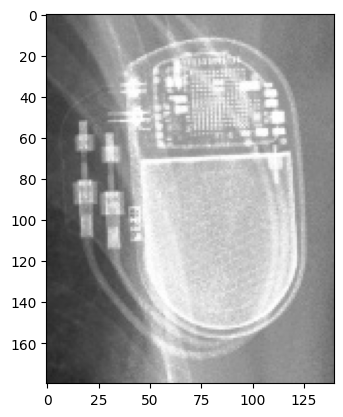

In [209]:
idx = 14
original_img_path = meta['img_path'].iloc[pacemaker_idx[idx]]
img = cv2.imread(img_dir + original_img_path)
# top:bottom, left:right
template = img[280:460, 760:900, :]
print(original_img_path.replace("/", "_"))
# plt.figure()
# plt.imshow(img)
plt.figure()
plt.imshow(template)

In [206]:
Image.fromarray(template).save(data_dir + "/" + original_img_path.replace("/", "_"))

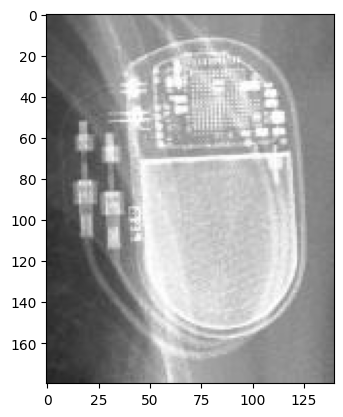

In [207]:
tmp = cv2.imread(data_dir + "/" + original_img_path.replace("/", "_"))
plt.imshow(tmp)

In [212]:
for filename in os.listdir(data_dir): 
    tmp = cv2.imread(os.path.join(data_dir, filename))
    print(tmp.shape)

(280, 210, 3)
(270, 140, 3)
(220, 190, 3)
(290, 180, 3)
(230, 190, 3)
(180, 170, 3)
(220, 180, 3)
(180, 140, 3)
(320, 240, 3)
(165, 175, 3)
(160, 160, 3)
(280, 220, 3)
(190, 214, 3)
(220, 185, 3)
(270, 220, 3)


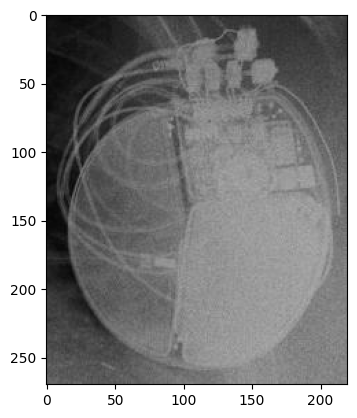

In [213]:
plt.imshow(tmp)

In [219]:
import PIL
from packaging import version
version.parse(PIL.__version__).base_version

'10.0.1'

In [221]:
from torchvision import transforms

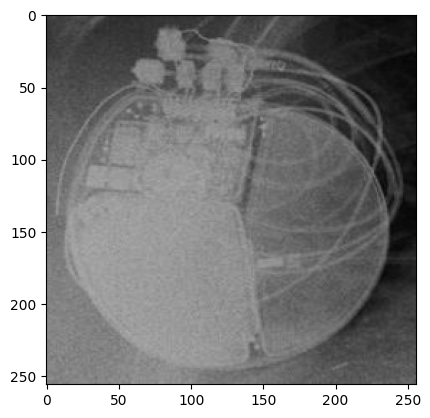

In [222]:
# the automatic image preprocessing in the dataset 
size = 256
image = Image.fromarray(tmp)
image = image.resize((size, size), resample=PIL.Image.Resampling.BICUBIC)
self_transform = transforms.RandomHorizontalFlip(p=0.5)
image = self_transform(image)
plt.imshow(image)

In [224]:
image.size

(256, 256)

In [1]:
from transformers import CLIPTokenizer

/data/healthy-ml/scratch/qixuanj/anaconda3/envs/control/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
tokenizer = CLIPTokenizer.from_pretrained("/data/healthy-ml/scratch/qixuanj/generative_validation/roentgen", subfolder="tokenizer")

In [9]:
token_ids = tokenizer.encode("round", add_special_tokens=False)

In [10]:
len(token_ids)

1

In [11]:
token_ids

[2522]